In [2]:
import matplotlib.image as mpimg
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import glob, os
import obspy
from obspy import read
from obspy import Stream
from obspy.core import UTCDateTime
import datetime
import cv2
import re
%matplotlib inline

Creating spectrogram and seismogram for Location 1, Node 2402000014, Jan 30


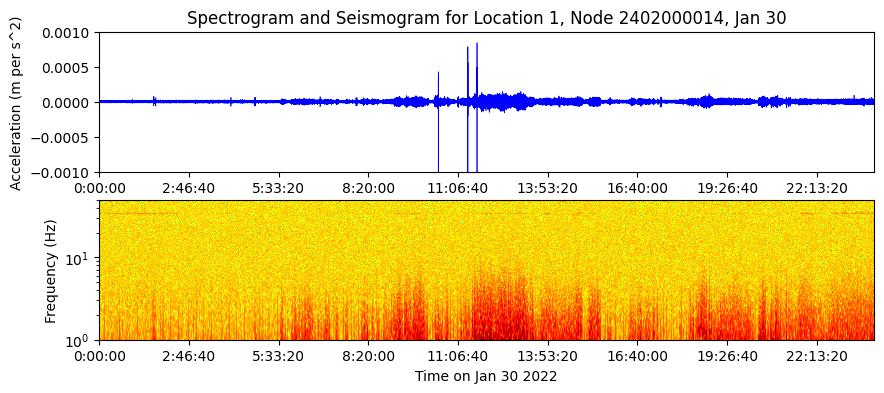

Creating spectrogram and seismogram for Location 1, Node 2402000017, Jan 30


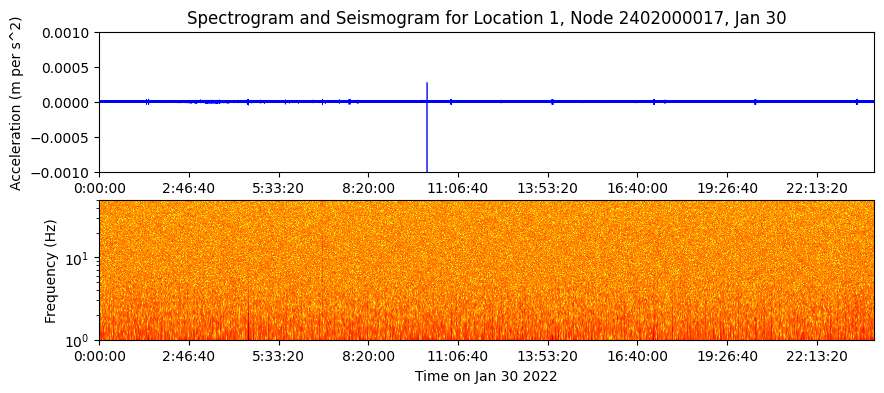

Creating spectrogram and seismogram for Location 1, Node 2402000018, Jan 30


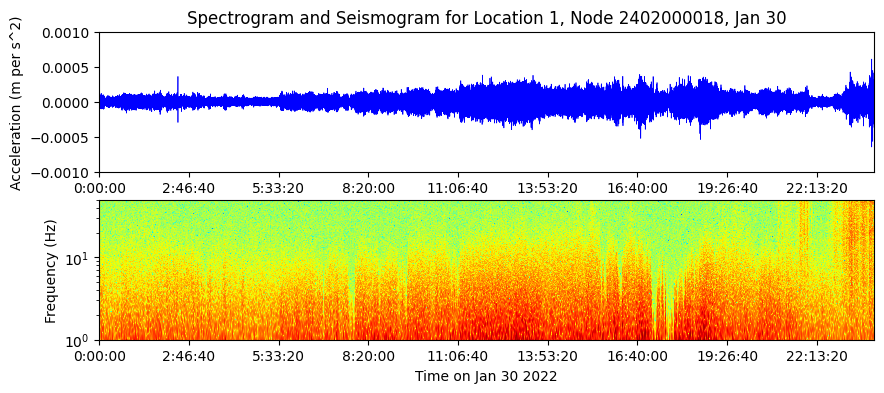

Creating spectrogram and seismogram for Location 1, Node 2402000019, Jan 30


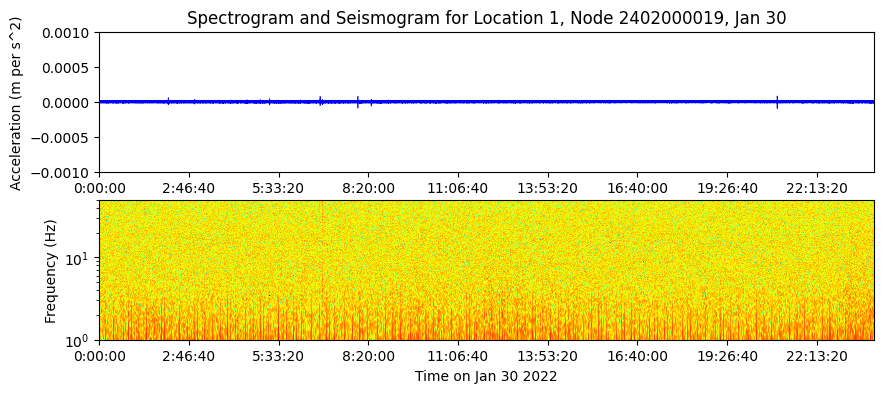

Creating spectrogram and seismogram for Location 1, Node 2402000020, Jan 30


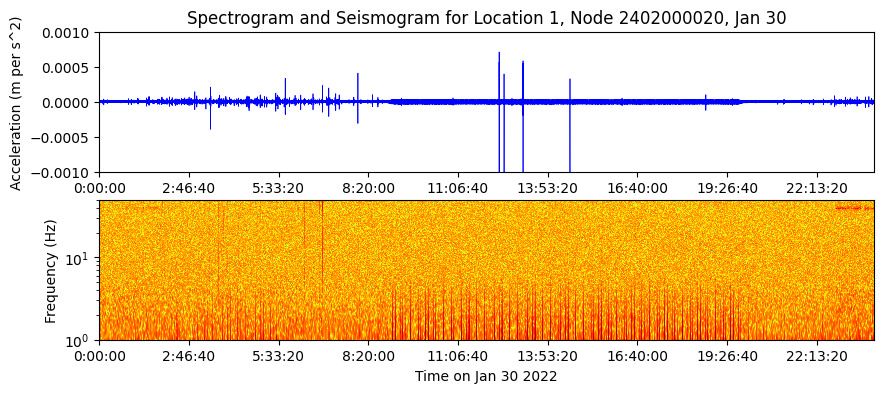

Creating spectrogram and seismogram for Location 1, Node 2402000021, Jan 30


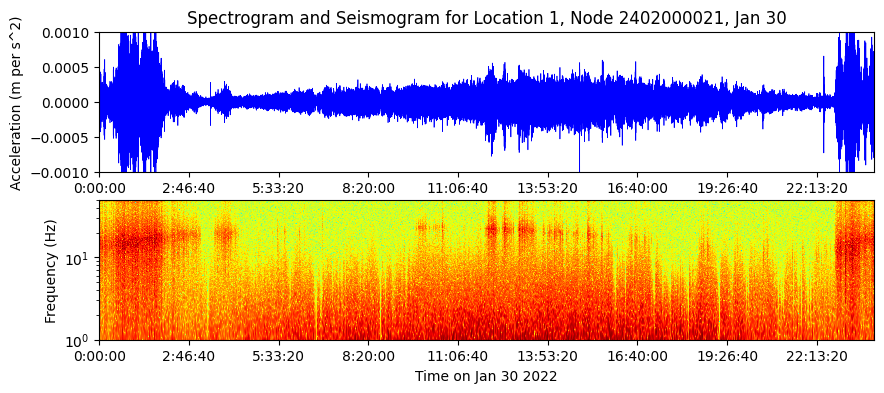

Creating spectrogram and seismogram for Location 1, Node 2402000023, Jan 30


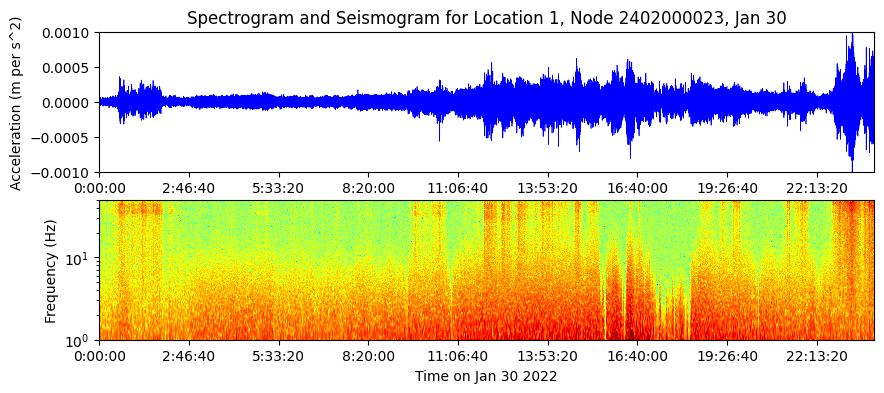

Creating spectrogram and seismogram for Location 1, Node 2402000024, Jan 30


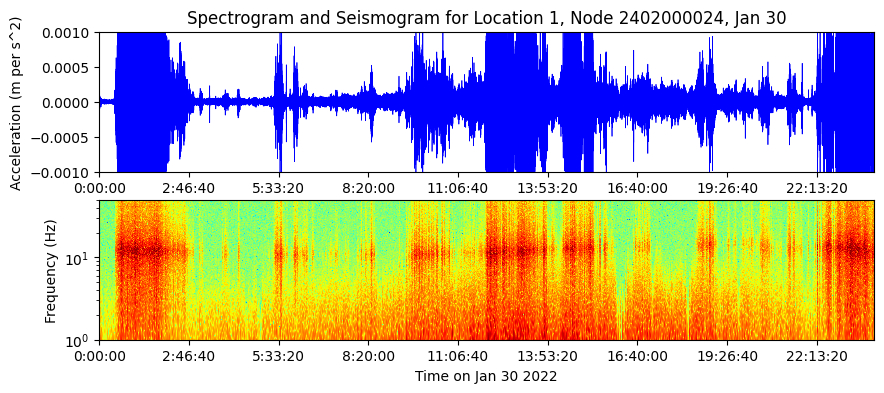

Creating spectrogram and seismogram for Location 1, Node 2402000029, Jan 30


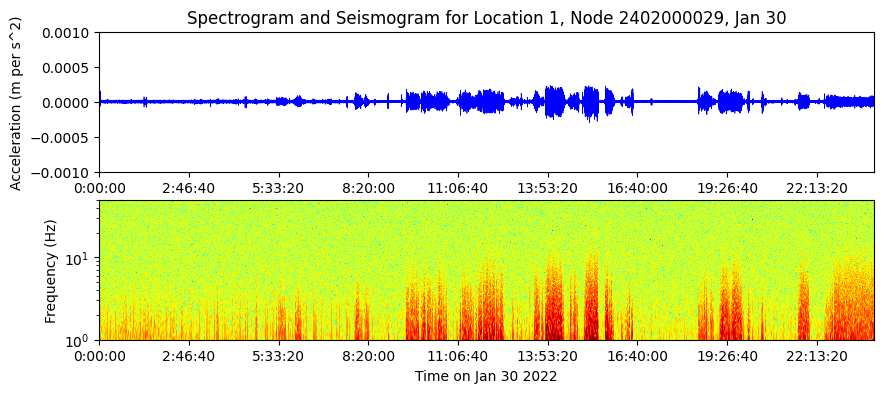

In [5]:
mseed_data_temp = os.path.join(r"C:\Users\sofia\Documents\4th Year Project\Antarctica data Mer\Location 1\*\Jan 30\*.mseed")
mseed_data = glob.glob(mseed_data_temp)
#print(mseed_data)
for i, trdata in enumerate(mseed_data):
    try:
        directory, filename = os.path.split(trdata)
        directory2, date = os.path.split(directory)
        directory3, node = os.path.split(directory2)
        directory4, location = os.path.split(directory3)
        directory5, Mer = os.path.split(directory4)
        print(f"Creating spectrogram and seismogram for {location}, {node}, {date}")
        st = read(trdata)
        fig, (ax, axx) = plt.subplots(2,1, figsize=(10,4))
        b = np.linspace(0, 86400, 43200001)
        ax.plot(b, st[0].data, lw=0.5, color='blue')
        ax.set_title(f"Spectrogram and Seismogram for {location}, {node}, {date}")
        ax.set_xlim(0, 86400)
        ax.set_ylabel('Acceleration (m per s^2)')
        ax.set_ylim(-0.001,0.001)
        tr = st[0].copy()
        tr.interpolate(sampling_rate=100)
        tr.spectrogram(samp_rate=100, per_lap=0.1, wlen=10, log=True, axes=axx, cmap='jet', dbscale=True, clip=[0.05, 0.95])
        axx.set_ylabel('Frequency (Hz)')
        axx.set_ylim(1, 50)
        axx.set_xlabel(f"Time on {date} 2022")
        def timeTicks(x, pos):
            d = datetime.timedelta(seconds=x)
            return str(d)
        formatter = matplotlib.ticker.FuncFormatter(timeTicks)
        ax.xaxis.set_major_formatter(formatter)
        axx.xaxis.set_major_formatter(formatter)
        #axx.grid(True)
        plt.show()
        path_to_specseis = os.path.join(directory5, "Antarctica SpecSeis by date2", location, date, f"Specseis {node}.png")
        fig.savefig(path_to_specseis)
        matplotlib.pyplot.close()
    except Exception as error:
        print(f"Failed to save Spectrogram and Seismogram for {location}, {node}, {date}")

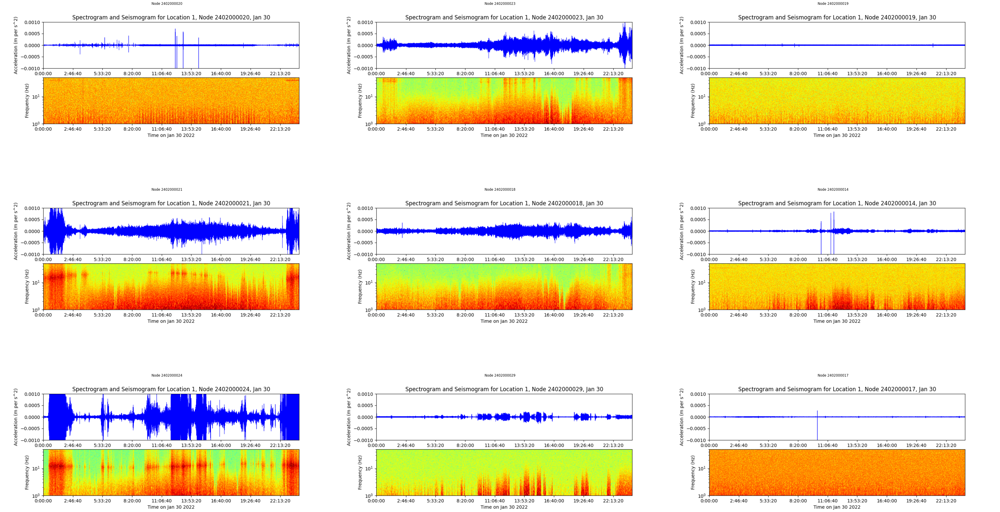

In [3]:
# code for displaying multiple images in one figure
  
# create figure
fig, ax = plt.subplots(3, 3, figsize=(50,30))
  
# reading images
parent_dir=r"C:\Users\sofia\Documents\4th Year Project\Antarctica SpecSeis by date2"
Location="Location 1"
Date="Jan 30"

Image1 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000020.png"))
Image2 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000023.png"))
Image3 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000019.png"))
Image4 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000021.png"))
Image5 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000018.png"))
Image6 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000014.png"))
Image7 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000024.png"))
Image8 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000029.png"))
Image9 = mpimg.imread(os.path.join(parent_dir, Location, Date, "Specseis Node 2402000017.png"))

  
# showing image
ax[0, 0].imshow(Image1)
ax[0, 0].axis('off')
ax[0, 0].set_title("Node 2402000020")
  
# showing image
ax[0, 1].imshow(Image2)
ax[0, 1].axis('off')
ax[0, 1].set_title("Node 2402000023")
  
# showing image
ax[0, 2].imshow(Image3)
ax[0, 2].axis('off')
ax[0, 2].set_title("Node 2402000019")
  
# showing image
ax[1, 0].imshow(Image4)
ax[1, 0].axis('off')
ax[1, 0].set_title("Node 2402000021")
  
# showing image
ax[1, 1].imshow(Image5)
ax[1, 1].axis('off')
ax[1, 1].set_title("Node 2402000018")
  
# showing image
ax[1, 2].imshow(Image6)
ax[1, 2].axis('off')
ax[1, 2].set_title("Node 2402000014")

  
# showing image
ax[2, 0].imshow(Image7)
ax[2, 0].axis('off')
ax[2, 0].set_title("Node 2402000024")

  
# showing image
ax[2, 1].imshow(Image8)
ax[2, 1].axis('off')
ax[2, 1].set_title("Node 2402000029")

  
# showing image
ax[2, 2].imshow(Image9)
ax[2, 2].axis('off')
ax[2, 2].set_title("Node 2402000017")

fig.tight_layout()
plt.show()
#path_to_figure = os.path.join(parent_dir, Location, Date, "Video", f"{Date}.png")
#fig.savefig(path_to_figure)
#matplotlib.pyplot.close()

In [8]:
import shutil
for filename in glob.glob(r"C:\Users\sofia\Documents\4th Year Project\Antarctica SpecSeis by date2\Location 1\*\Video\*"):
    directory, file = os.path.split(filename)
    new_dir=os.path.join(r"C:\Users\sofia\Documents\4th Year Project\Antarctica Data SpecSeis2\Location 1", file)
    shutil.copy(filename, new_dir)
print('Copied')

Copied
